In [1]:
import numpy as np
import os
from torch.utils.data import Dataset
import torch
from PIL import Image
import matplotlib.pyplot as plt
from albumentations.pytorch import ToTensorV2
import albumentations as A
import cv2
import sys
np.set_printoptions(threshold=sys.maxsize)

fail : has image - (736, 960, 3) and mask - (736, 960, 3). break from image number : 0
[[[  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [  0 252 124]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
  [169 169 169]
 

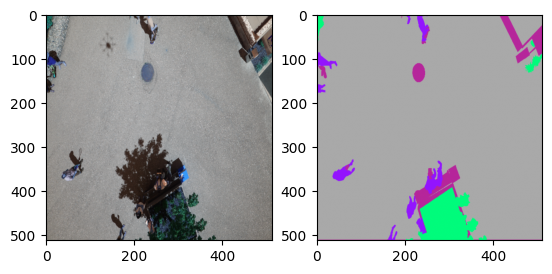

In [2]:
import torch.nn as nn
from torch.optim import Adam
from tqdm import tqdm

from skimage.transform import resize
from pathlib import Path

from torchvision import models
import segmentation_models_pytorch as smp


image_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\classes_dataset\\images'
mask_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\classes_dataset\\mask'

#image_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\images'
#mask_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\mask'

#backbone_model = models.resnet50(pretrained = True)

#backbone_layers = list(backbone_model.children())

#resnet18_model = models.resnet18(pretrained = True)
#res_layers = list(resnet18_model.children())




#print('resnet18 :', res_layers)

#print(backbone_layers)



images = [str(fn) for fn in Path(image_path).rglob('*.png')]
masks = [str(fn) for fn in Path(mask_path).rglob('*.png')]

for num, (i, m) in enumerate(zip(images, masks)) :
    im, msk = cv2.imread(i), cv2.imread(m)
    if im.shape != (512, 512) or msk.shape != (512, 512) :
        print(f"fail : has image - {im.shape} and mask - {msk.shape}. break from image number : {num}")
        print(msk)
        
        im, msk = resize(im, (512, 512)), resize(msk, (512, 512))
        
        #print(im.shape, msk.shape)
        fig, ax = plt.subplots(1, 2, squeeze = True)
        ax[0].imshow(im)
        ax[1].imshow(msk)
        
        
        plt.show()
        break

In [3]:
class MulticlassData(Dataset):
    def __init__(self, transform = None):
        self.transforms = transform
        image_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\classes_dataset\\images'
        mask_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\classes_dataset\\mask'
        
        #image_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\images'
        #mask_path = 'C:\\Users\\jaejiniida\\Desktop\\nested_unet_model(working)\\mask'

        self.images = [str(fn) for fn in Path(image_path).rglob('*.png')]
        self.masks = [str(fn) for fn in Path(mask_path).rglob('*.png')]
        
        #print(self.images)
        
        #print(self.masks)
    
    def __len__(self):
        return len(self.images)
    def __getitem__(self,index):
        
        #img = np.array(Image.open(self.images[index]))
        #mask = np.array(Image.open(self.masks[index]))
        
        img = np.array(Image.open(self.images[index]))
        mask = np.array(Image.open(self.masks[index]))
        
        
        print(img.shape, mask.shape)
        if self.transforms is not None:
            aug = self.transforms(image=img,mask=mask)
            img = aug['image']
            mask = aug['mask']
            print(img.shape, mask.shape)
            #mask = torch.max(mask,dim=2)[0]
        return img,mask

In [4]:
t1 = A.Compose([
    A.Resize(512, 512),
    A.augmentations.transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
])

In [5]:
def get_images(transform = None,batch_size=1,shuffle=True,pin_memory=True):
    data = MulticlassData(transform = t1)
    train_size = int(0.8 * data.__len__())
    test_size = data.__len__() - train_size
    train_dataset, test_dataset = torch.utils.data.random_split(data, [train_size, test_size])
    train_batch = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle, pin_memory=pin_memory)
    test_batch = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=shuffle, pin_memory=pin_memory)
    return train_batch,test_batch

In [6]:
train_batch,test_batch = get_images(transform =t1,batch_size=2)
#print([f.shape for f in iter(train_batch)])

160
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


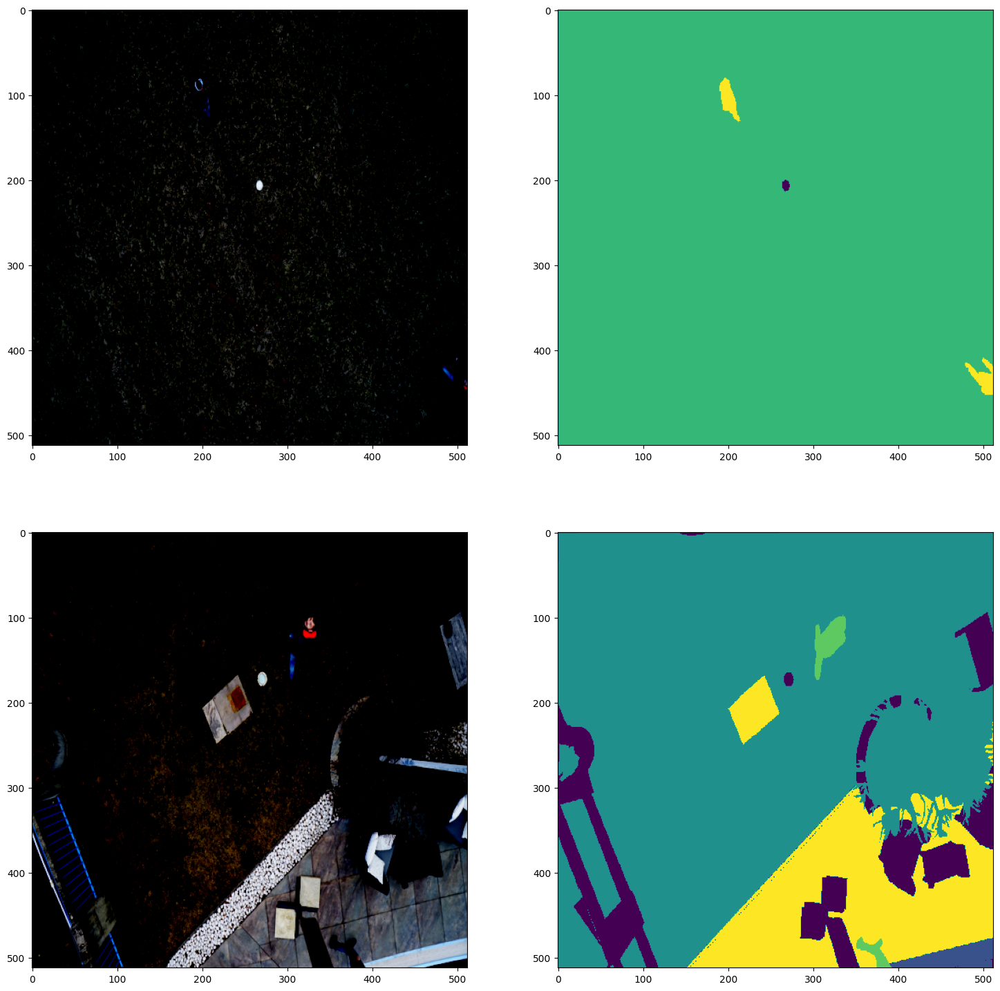

In [7]:
print(len(train_batch))

for img,mask in train_batch :
    img1 = np.transpose(img[0,:,:,:],(1,2,0))
    mask1 = np.array(mask[0,:,:])
    img2 = np.transpose(img[1,:,:,:],(1,2,0))
    mask2 = np.array(mask[1,:,:])
    fig , ax =  plt.subplots(2, 2, figsize=(18, 18))
    ax[0][0].imshow(img1)
    ax[0][1].imshow(mask1)
    ax[1][0].imshow(img2)
    ax[1][1].imshow(mask2)
    '''
    import sys
    np.set_printoptions(threshold=sys.maxsize)
    with open('aa.txt', 'w') as file :
        file.write(str(mask1))
    '''
    break

In [33]:
class encoding_block(nn.Module):
    def __init__(self,in_channels, out_channels):
        super(encoding_block,self).__init__()
        model = []
        model.append(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.ReLU(inplace=True))
        model.append(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.ReLU(inplace=True))
        self.conv = nn.Sequential(*model)
    def forward(self, x):
        return self.conv(x)    

In [34]:
'''
# Encoder as pretrained backbone Resnet50.

# try later when studying

from torchvision import models


class unet_model(nn.Module):
    def __init__(self, out_channels = 23, features = [64, 128, 256, 512]) :
        super(unet_model, self).__init__()
        
        self.backbone_model = models.resnet50(pretrained= True)
        self.backbone_layers = list(self.backbone_model.children())
    
        # encoding layers
        self.layer0 = nn.Sequential(*self.backbone_layers[:3])
        self.pool0 = self.backbone_layers[4]
        self.layer1 = nn.Sequential()
'''        
        

'\n# Encoder as pretrained backbone Resnet50.\n\n# try later when studying\n\nfrom torchvision import models\n\n\nclass unet_model(nn.Module):\n    def __init__(self, out_channels = 23, features = [64, 128, 256, 512]) :\n        super(unet_model, self).__init__()\n        \n        self.backbone_model = models.resnet50(pretrained= True)\n        self.backbone_layers = list(self.backbone_model.children())\n    \n        # encoding layers\n        self.layer0 = nn.Sequential(*self.backbone_layers[:3])\n        self.pool0 = self.backbone_layers[4]\n        self.layer1 = nn.Sequential()\n'

In [35]:
'''
class unet_model(nn.Module):
    def __init__(self,out_channels=23,features=[64, 128, 256, 512]):
        super(unet_model,self).__init__()
        self.pool = nn.MaxPool2d(kernel_size=(2,2),stride=(2,2))
        self.conv1 = encoding_block(3,features[0])
        self.conv2 = encoding_block(features[0],features[1])
        self.conv3 = encoding_block(features[1],features[2])
        self.conv4 = encoding_block(features[2],features[3])
        self.conv5 = encoding_block(features[3]*2,features[3])
        self.conv6 = encoding_block(features[3],features[2])
        self.conv7 = encoding_block(features[2],features[1])
        self.conv8 = encoding_block(features[1],features[0])        
        self.tconv1 = nn.ConvTranspose2d(features[-1]*2, features[-1], kernel_size=2, stride=2)
        self.tconv2 = nn.ConvTranspose2d(features[-1], features[-2], kernel_size=2, stride=2)
        self.tconv3 = nn.ConvTranspose2d(features[-2], features[-3], kernel_size=2, stride=2)
        self.tconv4 = nn.ConvTranspose2d(features[-3], features[-4], kernel_size=2, stride=2)        
        self.bottleneck = encoding_block(features[3],features[3]*2)
        self.final_layer = nn.Conv2d(features[0],out_channels,kernel_size=1)
    def forward(self,x):
        skip_connections = []
        x = self.conv1(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.conv2(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.conv3(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.conv4(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        x = self.tconv1(x)
        x = torch.cat((skip_connections[0], x), dim=1)
        x = self.conv5(x)
        x = self.tconv2(x)
        x = torch.cat((skip_connections[1], x), dim=1)
        x = self.conv6(x)
        x = self.tconv3(x)
        x = torch.cat((skip_connections[2], x), dim=1)
        x = self.conv7(x)        
        x = self.tconv4(x)
        x = torch.cat((skip_connections[3], x), dim=1)
        x = self.conv8(x)
        x = self.final_layer(x)
        return x
    '''

'\nclass unet_model(nn.Module):\n    def __init__(self,out_channels=23,features=[64, 128, 256, 512]):\n        super(unet_model,self).__init__()\n        self.pool = nn.MaxPool2d(kernel_size=(2,2),stride=(2,2))\n        self.conv1 = encoding_block(3,features[0])\n        self.conv2 = encoding_block(features[0],features[1])\n        self.conv3 = encoding_block(features[1],features[2])\n        self.conv4 = encoding_block(features[2],features[3])\n        self.conv5 = encoding_block(features[3]*2,features[3])\n        self.conv6 = encoding_block(features[3],features[2])\n        self.conv7 = encoding_block(features[2],features[1])\n        self.conv8 = encoding_block(features[1],features[0])        \n        self.tconv1 = nn.ConvTranspose2d(features[-1]*2, features[-1], kernel_size=2, stride=2)\n        self.tconv2 = nn.ConvTranspose2d(features[-1], features[-2], kernel_size=2, stride=2)\n        self.tconv3 = nn.ConvTranspose2d(features[-2], features[-3], kernel_size=2, stride=2)\n     

In [36]:
from torchvision import models

unet_model = smp.UnetPlusPlus(encoder_name = 'resnet50', 
                         encoder_weights = 'imagenet',
                         in_channels = 3,
                         classes = 24)

unet_model_res152 = smp.UnetPlusPlus(encoder_name = 'resnet152',
                        encoder_weights = 'imagenet',
                        in_channels = 3,
                        classes = 24)

unet_model_effv2 = smp.UnetPlusPlus(encoder_name = 'efficientnet-b6',
                        encoder_weights = 'imagenet',
                        in_channels = 3,
                        classes = 24)


In [8]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(DEVICE)

cuda


In [38]:
from torchsummary import summary

In [39]:
model = unet_model.to(DEVICE)
model_res152 = unet_model_res152.to(DEVICE)
model_effv2 = unet_model_effv2.to(DEVICE)

In [40]:

summary(model, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          16,384
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]          16,384
      BatchNorm2d-14          [-1, 256,

In [41]:
summary(model_res152, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          16,384
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]          16,384
      BatchNorm2d-14          [-1, 256,

In [42]:
summary(model_effv2, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 3, 257, 257]               0
Conv2dStaticSamePadding-2         [-1, 56, 128, 128]           1,512
       BatchNorm2d-3         [-1, 56, 128, 128]             112
MemoryEfficientSwish-4         [-1, 56, 128, 128]               0
         ZeroPad2d-5         [-1, 56, 130, 130]               0
Conv2dStaticSamePadding-6         [-1, 56, 128, 128]             504
       BatchNorm2d-7         [-1, 56, 128, 128]             112
MemoryEfficientSwish-8         [-1, 56, 128, 128]               0
          Identity-9             [-1, 56, 1, 1]               0
Conv2dStaticSamePadding-10             [-1, 14, 1, 1]             798
MemoryEfficientSwish-11             [-1, 14, 1, 1]               0
         Identity-12             [-1, 14, 1, 1]               0
Conv2dStaticSamePadding-13             [-1, 56, 1, 1]             840
         I

In [43]:
LEARNING_RATE = 1e-4
num_epochs = 15

In [44]:
loss_fn = nn.CrossEntropyLoss()
opt1 = Adam(model.parameters(), lr=LEARNING_RATE)
opt2 = Adam(model_res152.parameters(), lr=LEARNING_RATE)
opt3 = Adam(model_effv2.parameters(), lr=LEARNING_RATE)
scaler = torch.cuda.amp.GradScaler()

In [45]:
# Unet++ with resnet50 as 2_model.h5, Unet++ with resnet152 as 1_model.h5, Unet++ with effb6 as 0_model.h5
# continue with 2_model to form an ensemble.

#for i, (model, optimizer) in enumerate(zip([model, model_res152, model_effv2], [opt1, opt2, opt3])) :
for i, (model, optimizer) in enumerate(zip([model,model_res152,model_effv2], [opt1,opt2,opt3])) :
    for epoch in range(num_epochs):
        loop = tqdm(enumerate(train_batch),total=len(train_batch))
        for batch_idx, (data, targets) in loop:
            data = data.to(DEVICE)
            targets = targets.to(DEVICE)
            targets = targets.type(torch.long)
            # forward
            with torch.cuda.amp.autocast():
                predictions = model(data)
                loss = loss_fn(predictions, targets)
            # backward
            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # update tqdm loop
            loop.set_postfix(loss=loss.item())
    print(f"model ({i}) training complete. Saving model..")
    torch.save(model, '2_trained_model.h5')

  0%|          | 0/160 [00:00<?, ?it/s]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  1%|          | 1/160 [00:02<05:28,  2.06s/it, loss=3.47]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  1%|▏         | 2/160 [00:03<04:39,  1.77s/it, loss=2.93]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  2%|▏         | 3/160 [00:05<04:10,  1.60s/it, loss=3.07]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  2%|▎         | 4/160 [00:06<03:53,  1.50s/it, loss=2.76]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  2%|▎         | 4/160 [00:07<05:04,  1.95s/it, loss=2.76]


KeyboardInterrupt: 

In [9]:
class MyEnsemble(nn.Module):

    def __init__(self, modelA, modelB, modelC):
        super(MyEnsemble, self).__init__()
        self.modelA = modelA
        self.modelB = modelB
        self.modelC = modelC

        #self.fc1 = nn.Linear(input, 2*24*512*512)
        #print(self.fc1)

    def forward(self, x):
        out1 = self.modelA(x)
        out2 = self.modelB(x)
        out3 = self.modelC(x)

        x = (out1 + out2 + out3) / 3
        return x
        #print(out.shape)

        #x = self.fc1(out)
        #return torch.softmax(x, dim=1) #voting

In [10]:
# Clear cuda cache.

torch.cuda.empty_cache()

In [11]:
# Load pretrained models.


#ensemble_model = torch.load('1_trained_model.h5')

models = [torch.load(f"{i}_trained_model.h5") for i in range(3)]
ensemble_model = MyEnsemble(models[0], models[1], models[2]).to(DEVICE)
#summary(ensemble_model, (3, 256, 256))

In [11]:
def check_accuracy(loader, model):
    num_correct = 0
    num_pixels = 0
    dice_score = 0
    ensemble_model.eval()

    with torch.no_grad():
        for x, y in tqdm(loader):
            x = x.to(DEVICE)
            y = y.to(DEVICE)
            
            softmax = nn.Softmax(dim=1)
            preds = torch.argmax(softmax(model(x)),axis=1)
            pred_tmp = softmax(ensemble_model(x))
            
            #print(preds.shape, pred_tmp.shape)
            
            num_correct += (preds == y).sum()
            num_pixels += torch.numel(preds)
            
            for i in range(pred_tmp.shape[1]) :
                dice_score += (2 * (pred_tmp[:,i,:,:] * y).sum()) / ((pred_tmp[:,i,:,:] + y).sum() + 1e-8)

    print(f"Got {num_correct}/{num_pixels} with acc {num_correct/num_pixels*100:.2f}")
    #print(len(loader))
    print(f"Dice score: {dice_score/((len(loader))*2)}")
    model.train()

In [16]:
check_accuracy(train_batch, ensemble_model)

  0%|          | 0/160 [00:00<?, ?it/s]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  1%|          | 1/160 [00:05<14:05,  5.32s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  1%|▏         | 2/160 [00:06<07:45,  2.94s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  2%|▏         | 3/160 [00:07<05:38,  2.16s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  2%|▎         | 4/160 [00:09<04:39,  1.79s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  3%|▎         | 5/160 [00:10<04:06,  1.59s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  4%|▍         | 6/160 [00:11<03:43,  1.45s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  4%|▍         | 7/160 [00:12<03:31,  1.38s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  5%|▌         | 8/160 [00:13<03:22,  1.33s/it]

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


  5%|▌         | 8/160 [00:14<04:43,  1.87s/it]


KeyboardInterrupt: 

In [ ]:
check_accuracy(test_batch, ensemble_model)

(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])
(736, 960, 3) (736, 960)
torch.Size([3, 512, 512]) torch.Size([512, 512])


RuntimeError: CUDA out of memory. Tried to allocate 32.00 MiB (GPU 0; 6.00 GiB total capacity; 5.16 GiB already allocated; 0 bytes free; 5.32 GiB reserved in total by PyTorch)

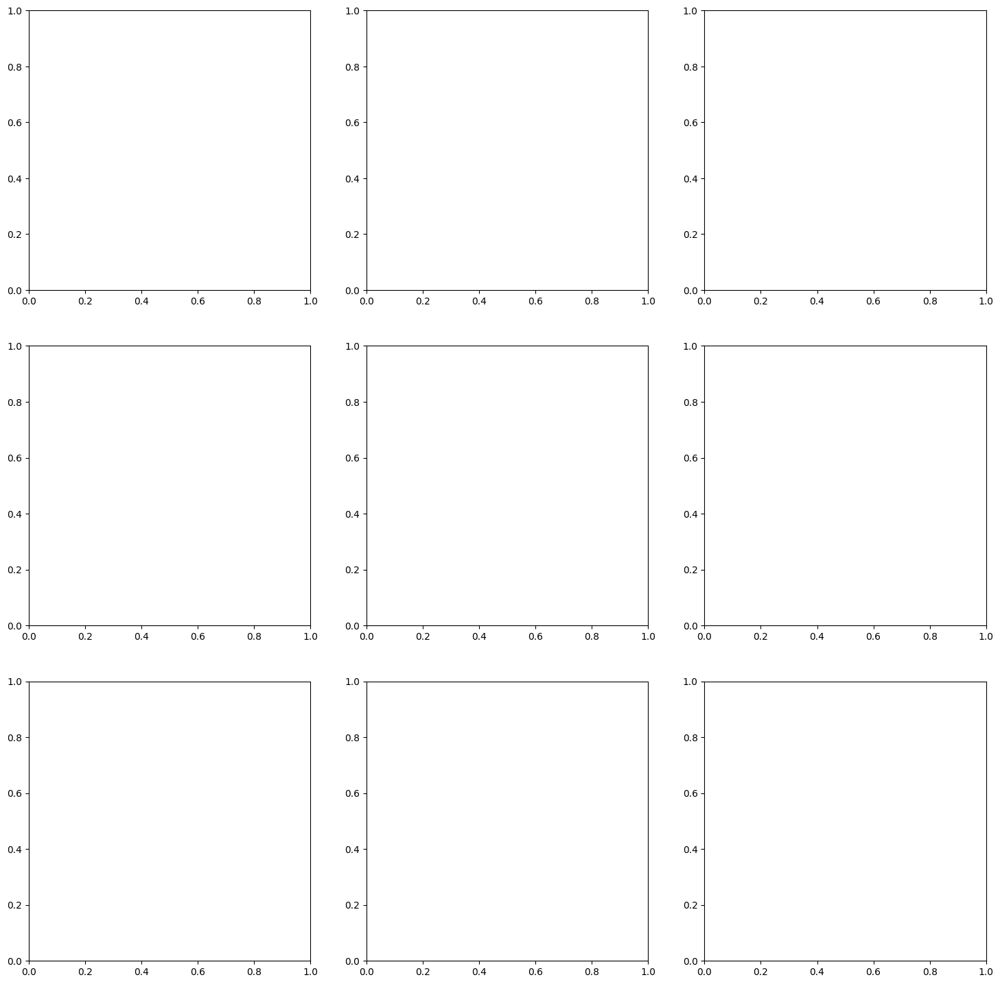

In [12]:
for x,y in test_batch:
    x = x.to(DEVICE)
    fig , ax =  plt.subplots(3, 3, figsize=(18, 18))
    softmax = nn.Softmax(dim=1)
    preds = torch.argmax(softmax(ensemble_model(x)),axis=1).to('cpu')
    img1 = np.transpose(np.array(x[0,:,:,:].to('cpu')),(1,2,0))
    preds1 = np.array(preds[0,:,:])
    mask1 = np.array(y[0,:,:])
    img2 = np.transpose(np.array(x[1,:,:,:].to('cpu')),(1,2,0))
    preds2 = np.array(preds[1,:,:])
    mask2 = np.array(y[1,:,:])
    ax[0,0].set_title('Image')
    ax[0,1].set_title('Prediction')
    ax[0,2].set_title('Mask')
    ax[1,0].set_title('Image')
    ax[1,1].set_title('Prediction')
    ax[1,2].set_title('Mask')
    ax[0][0].axis("off")
    ax[1][0].axis("off")
    ax[0][1].axis("off")
    ax[1][1].axis("off")
    ax[0][2].axis("off")
    ax[1][2].axis("off")
    ax[0][0].imshow(img1)
    ax[0][1].imshow(preds1)
    ax[0][2].imshow(mask1)
    ax[1][0].imshow(img2)
    ax[1][1].imshow(preds2)
    ax[1][2].imshow(mask2)   
    break